In [1]:
import plotly.graph_objects as go
import numpy as np

In [2]:
import pandas as pd

In [3]:
cities = '''北京市, 上海市, 广东省, 江苏省, 山东省, 浙江省, 河北省, 天津市, 安徽省, 湖北省, 山西省, 福建省, 河南省, 重庆市, 四川省, 陕西省, 湖南省, 辽宁省, 江西省, 甘肃省, 云南省, 海南省, 广西壮族自治区, 黑龙江省, 贵州省, 内蒙古自治区, 吉林省, 青海省, 宁夏回族自治区, 新疆维吾尔自治区, 西藏自治区'''

In [4]:
cities = cities.upper().replace('\n','').split(', ')

In [5]:
counts = [51188, 47772, 45217, 40656, 29343, 21576, 17791, 14695, 13992, 12897, 12281, 12052, 10357, 9851, 9608, 8897, 6939, 5184, 4059, 2797, 2304,
         2063, 2050, 1846, 1846, 1558, 852, 642, 387, 309, 17]

In [6]:
sales = [6599, 7289, 15666, 2911, 7342, 7835, 2827, 3187, 2101, 948, 1084, 3139, 4028, 1348, 
        1725, 1743, 1341, 642, 1084, 187, 530, 243, 3532, 158, 801, 241, 180, 48, 121, 244, 3]

In [7]:
miles = [1013, 900, 8338, 4692, 5821, 4154, 6531, 1248, 4673, 6251, 5335, 5227, 6522, 3023, 6820, 5279, 6418, 4212, 6300,
        4014, 4920, 795, 5259, 4512, 5833, 6500, 3218, 3223, 1768, 4578, 613]

In [8]:
electric_bars = pd.DataFrame({'cities':cities, 'numbers':counts, 'miles':miles}) #Create a DataFrame

In [9]:
import requests_html
session = requests_html.HTMLSession()
geojson = session.get('https://geo.datav.aliyun.com/areas_v2/bound/100000_full.json').json() # get geojson from datav

In [10]:
token = 'pk.eyJ1IjoidDJ3b3NldmVuIiwiYSI6ImNrNnhidXlxeTBsaXkzbHFud2Yzemd1NGUifQ.-IO9TyL5AmnWLXT2TpCbew' #token for mapbox, your token should be here

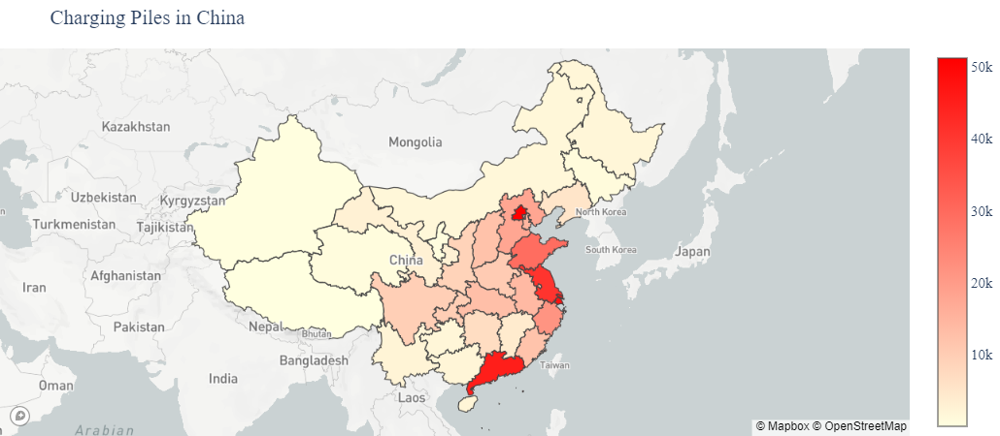

In [11]:
fig_piles_map = go.Figure()
fig_piles_map.add_trace(go.Choroplethmapbox(geojson = geojson, locations=electric_bars.cities, featureidkey = 'properties.name', z=electric_bars.numbers, colorscale=['lightyellow','red']))
fig_piles_map.update_layout(mapbox = dict(center={'lon':108.15, 'lat':37.32}, zoom = 2.5, style='light', accesstoken = token), title="Charging Piles in China", 
                  font_family = 'Times New Roman',
                  font_size = 15, margin={"r":0,"t":50,"l":0,"b":0})
fig_piles_map.show()

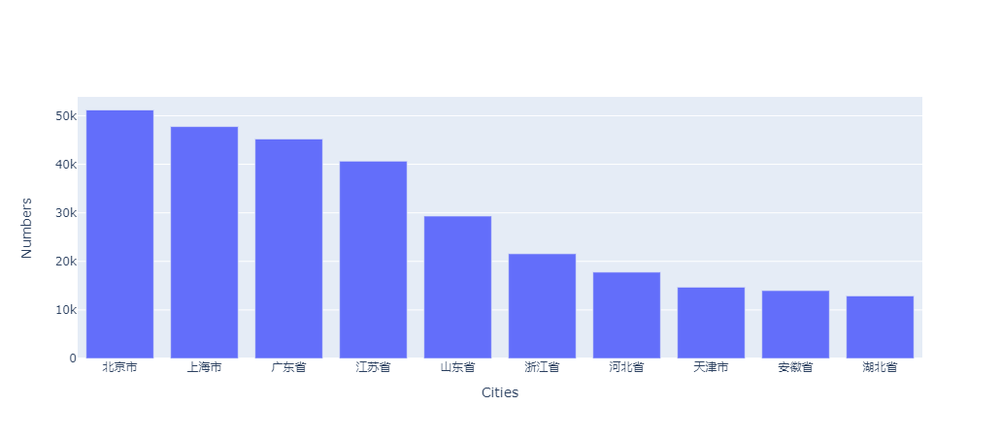

In [12]:
fig_piles_bar = go.Figure()
fig_piles_bar.add_trace(go.Bar(x=electric_bars.cities[:10], y=electric_bars.numbers[:10]))
fig_piles_bar.update_layout(xaxis=dict(title = 'Cities'), yaxis=dict(title = 'Numbers'))
fig_piles_bar.show()

In [13]:
from plotly.subplots import make_subplots

In [14]:
fig_dble = make_subplots(rows=1, cols=2,
                   specs=[[{'type':'Choroplethmapbox'},{'type':'bar'}]],
                   column_width = [0.7, 0.3])

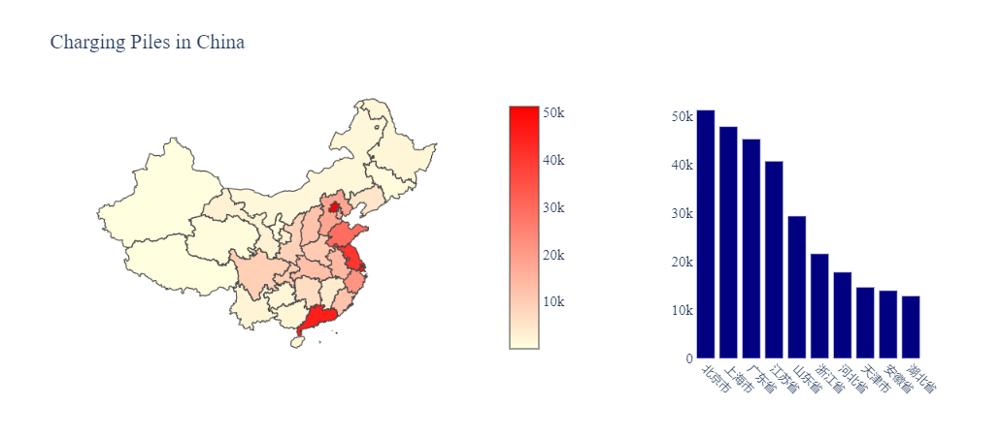

In [15]:
fig_dble.add_trace(go.Bar(x=electric_bars.cities[:10], y=electric_bars.numbers[:10]),row=1, col=2)
fig_dble.add_trace(go.Choroplethmapbox(geojson = geojson, locations=electric_bars.cities, featureidkey = 'properties.name', z=electric_bars.numbers, colorscale=['lightyellow','red'], colorbar={'x':0.5}),row=1,col=1)
fig_dble.update_mapboxes(center={'lon':118.15, 'lat':37.32}, zoom = 2, accesstoken = token, style='white-bg')
fig_dble.update_traces(row=1, col=2, marker_color='navy')
fig_dble.update_xaxes(tickangle=45,tickfont=dict(size=12, family='Times New Roman'))
fig_dble.update_layout(title="Charging Piles in China", plot_bgcolor='white',showlegend=False, font = {'family':'Times New Roman', 'size':15})
fig_dble.show()

In [16]:
sales_df = pd.DataFrame({'cities':cities, 'sales':sales})
sales_df = sales_df.sort_values(by='sales',ascending = False)

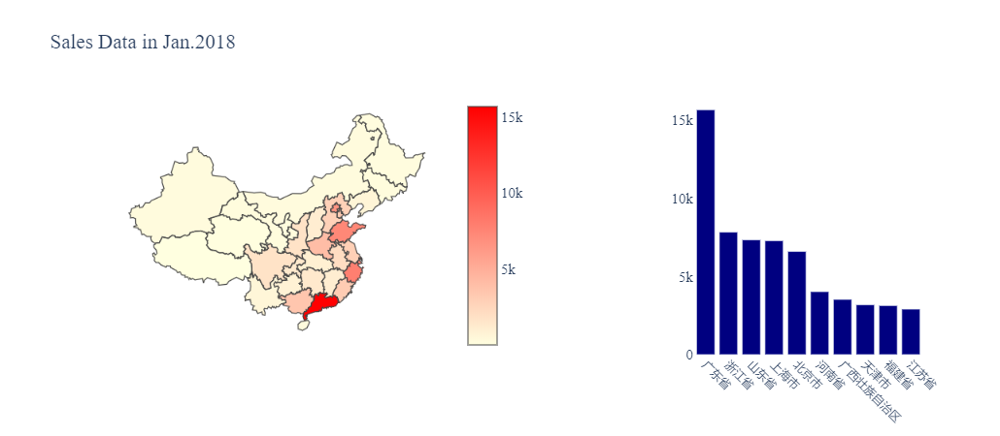

In [17]:
fig_sales = make_subplots(rows=1, cols=2, specs=[[{'type':'Choroplethmapbox'}, {'type':'bar'}]], column_widths=[0.7, 0.3])
fig_sales.add_trace(go.Choroplethmapbox(geojson = geojson, locations = sales_df.cities, z=sales_df.sales, featureidkey='properties.name',
                                                         colorscale=['lightyellow','red'], colorbar={'x':0.45}), row=1, col=1)
fig_sales.add_trace(go.Bar(x=sales_df.cities[:10], y=sales_df.sales[:10]),row=1, col=2)
fig_sales.update_mapboxes(center={'lon':118.15, 'lat':37.32}, zoom = 1.8, accesstoken = token, style='white-bg')
fig_sales.update_traces(row = 1, col = 2, marker_color='navy')
fig_sales.update_xaxes(tickangle=45, tickfont=dict(size=12, family='Times New Roman'))
fig_sales.update_layout(title = 'Sales Data in Jan.2018', font = {'family':'Times New Roman', 'size':15}, plot_bgcolor = 'white')
fig_sales.show()

## AHP

In [18]:
import scipy.linalg as sl

- 权重矩阵
- 一致性检验

In [19]:
weightmatrix = np.array([[1,4,5],
                      [1/4,1,2],
                      [1/5,1/2,1]])
eigvals, eigvec = sl.eig(weightmatrix)
numerator = np.max(np.real(eigvals))-3
denomirator = 3-1
CI = numerator/denomirator
RI = 0.52
print(CI/RI<0.1)

True


In [20]:
P = np.real(eigvec)
v = P[:,0]
weight_v = P[:,0]/np.sum(v)
print(weight_v)

[0.68334046 0.19980996 0.11684958]


- 通用得分矩阵计算

In [21]:
def eigenvec(frac):
    matrix = np.array([[1,frac],[1/frac,1]])
    eigvals, eigvec = sl.eig(matrix)
    P = np.real(eigvec)
    v = P[:,0]
    norm_v = v/np.sum(v)
    return norm_v

- 车成本得分矩阵

In [22]:
tr_p = 242104
el_p = 174375
frac_p = el_p/tr_p
print(frac_p)
price_point = eigenvec(frac_p)
print(eigenvec(frac_p))

0.7202483230347289
[0.41868858 0.58131142]


- 能源得分矩阵
 - 获取能源的便捷程度
 - 时间因素

In [23]:
density_el = 45217
density_tr = 5478*12*6 #18 is bonus factor
frac_density = density_tr/density_el
print(frac_density)

8.722737023685783


In [24]:
density_point = eigenvec(frac_density)
print(eigenvec(frac_density))

[0.8971483 0.1028517]


- 续航矩阵

In [25]:
el_km = 250
tr_km = 600
frac_km = tr_km/el_km
print(frac_km)
km_point = eigenvec(frac_km)
print(eigenvec(frac_km))

2.4
[0.70588235 0.29411765]


- Final Points

In [26]:
tr_point = 0
el_point = 0
points = [price_point, density_point, km_point]
for i in range(3):
    tr_point += weight_v[i]*points[i][0]
    el_point += weight_v[i]*points[i][1]
print(tr_point, el_point)

0.5478480682164073 0.45215193178359275
